In [12]:
import SimpleITK as sitk
import matplotlib.pyplot as plt
import os
import numpy as np
from scipy.ndimage import zoom
import gui
%matplotlib notebook

There are 4 folders in the DICOM directory. I looked at each in ImageJ, and the first (OBJ_0000) appears to contain slices with no lung (only 2 images). OBJ_0001 contains 824 slices at 768x768 resolution. OBJ_0002 contains the same 824 slices at 1024x1024 resolution. OBJ_0003 contains just one DICOM file, only containing information about the scan.

Here I'll load the smaller resolution images for testing.

In [2]:
dicom_dir = "/home/stuartt/data/lungmap/D175_CT_Scan/D175_Left_Lung_CT_DICOMS/IMediaExport/DICOM/PAT_0000/STD_0000/SER_0001/OBJ_0001/"

In [3]:
series_reader = sitk.ImageSeriesReader()
cur_paths = series_reader.GetGDCMSeriesFileNames(dicom_dir)

In [4]:
c_img = sitk.ReadImage(cur_paths)

Remove the top slices since they screw up the segmentation (region grows into everything)

In [5]:
c_img = c_img[:,:,:800]

Rescale intensities to between 0 and 255

In [6]:
c_img = sitk.RescaleIntensity(c_img)

Define a copy with 8-bit encoding for plotting

In [7]:
img_plot = sitk.Cast(c_img, sitk.sitkUInt8)

## View lung

The intensities for this scan are a bit weird, with the minimum being a negative value. Looking at the scan in ImageJ is very helpful to see the 3D view, the range of intensities, and to choose points for segmentation.

<IPython.core.display.Javascript object>


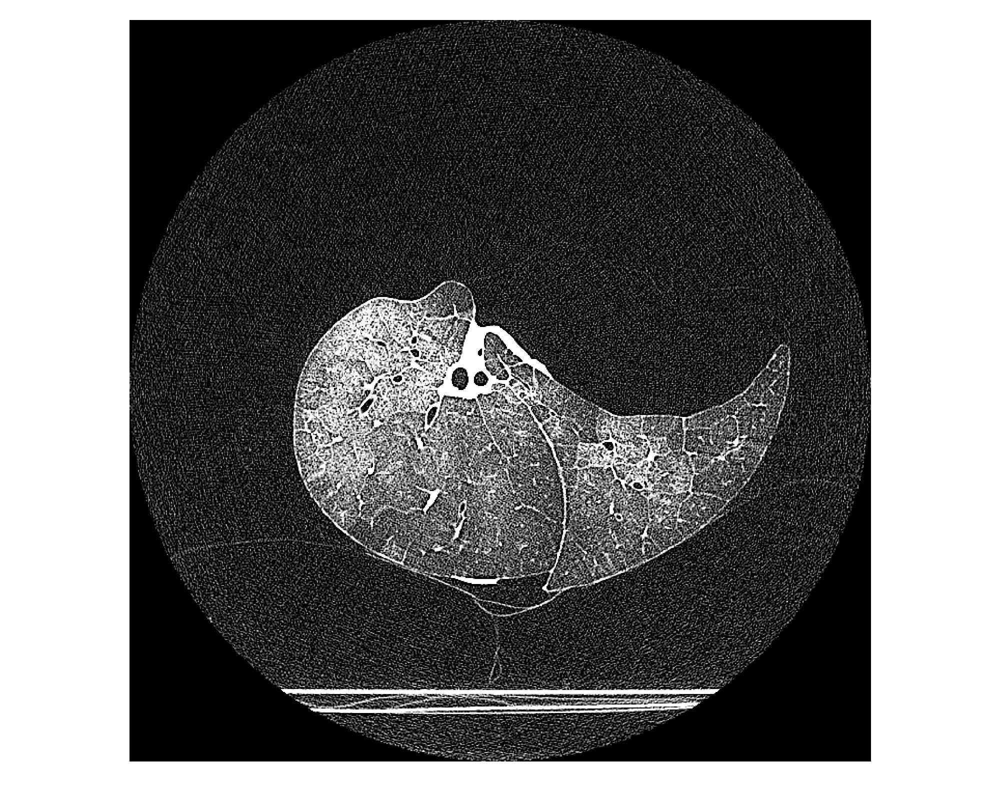

In [13]:
gui.MultiImageDisplay([img_plot])

## Region-growing segmentation

Choose a point to start the segmentation from

<IPython.core.display.Javascript object>


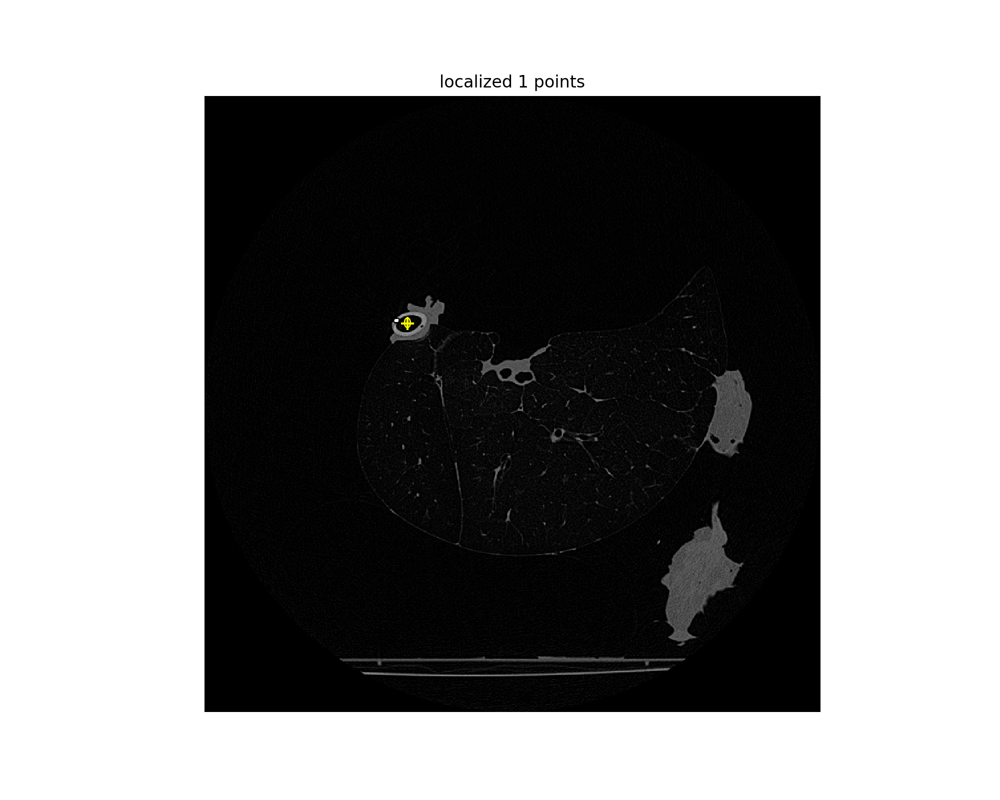

In [14]:
point_acquisition_interface = gui.PointDataAquisition(c_img)

In [15]:
initial_seed_point_indexes = point_acquisition_interface.get_point_indexes()

In [16]:
initial_seed_point_indexes

[(253, 283, 576)]

In [17]:
seg_implicit_thresholds = sitk.ConfidenceConnected(
    c_img,
    seedList=initial_seed_point_indexes,
    numberOfIterations=1,
    multiplier=1,
    initialNeighborhoodRadius=3,
    replaceValue=1
)

In [18]:
img_int = sitk.Cast(sitk.RescaleIntensity(c_img), seg_implicit_thresholds.GetPixelID())

<IPython.core.display.Javascript object>


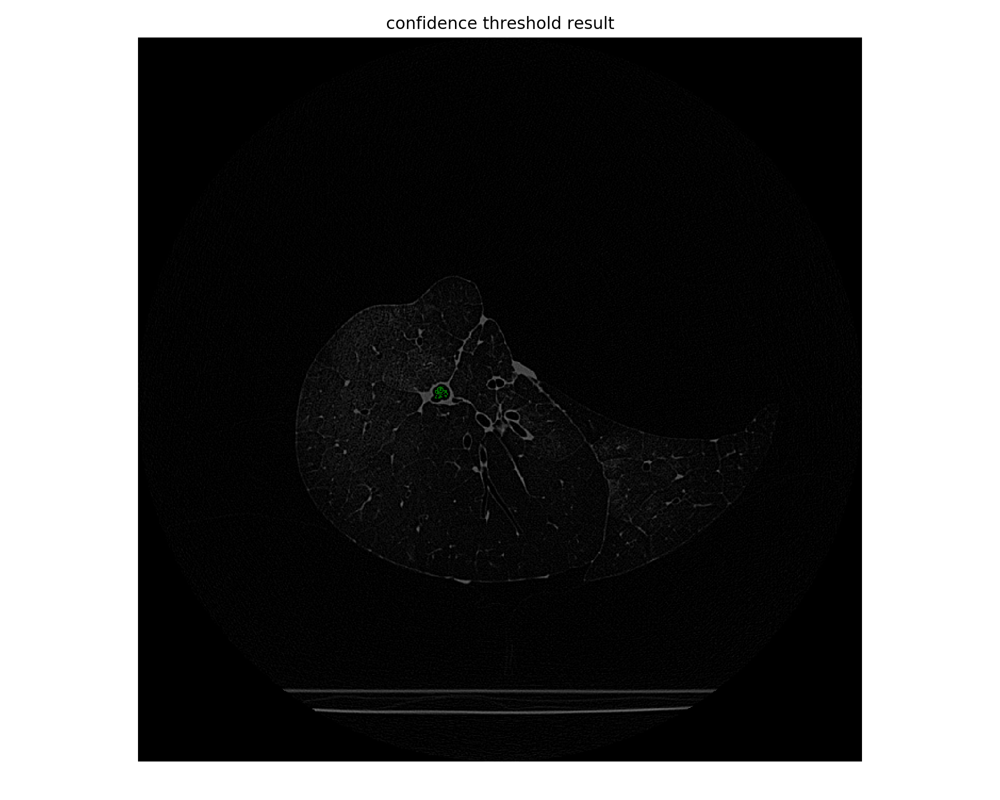

In [19]:
gui.MultiImageDisplay(image_list = [sitk.LabelOverlay(img_int, seg_implicit_thresholds)],                   
                      title_list = ['confidence threshold result'])

## Smoothing
Region growing can benefit from smoothing the images beforehand to create a smooth distribution.

In [20]:
gaussian = sitk.SmoothingRecursiveGaussianImageFilter()

In [21]:
gaussian.SetSigma(1/3)
gaussian.SetNumberOfThreads(10)
imsmooth = gaussian.Execute(c_img)

In [22]:
pixelID = c_img.GetPixelID()
caster = sitk.CastImageFilter()
caster.SetOutputPixelType(pixelID)
imsmooth = caster.Execute(imsmooth)

<IPython.core.display.Javascript object>


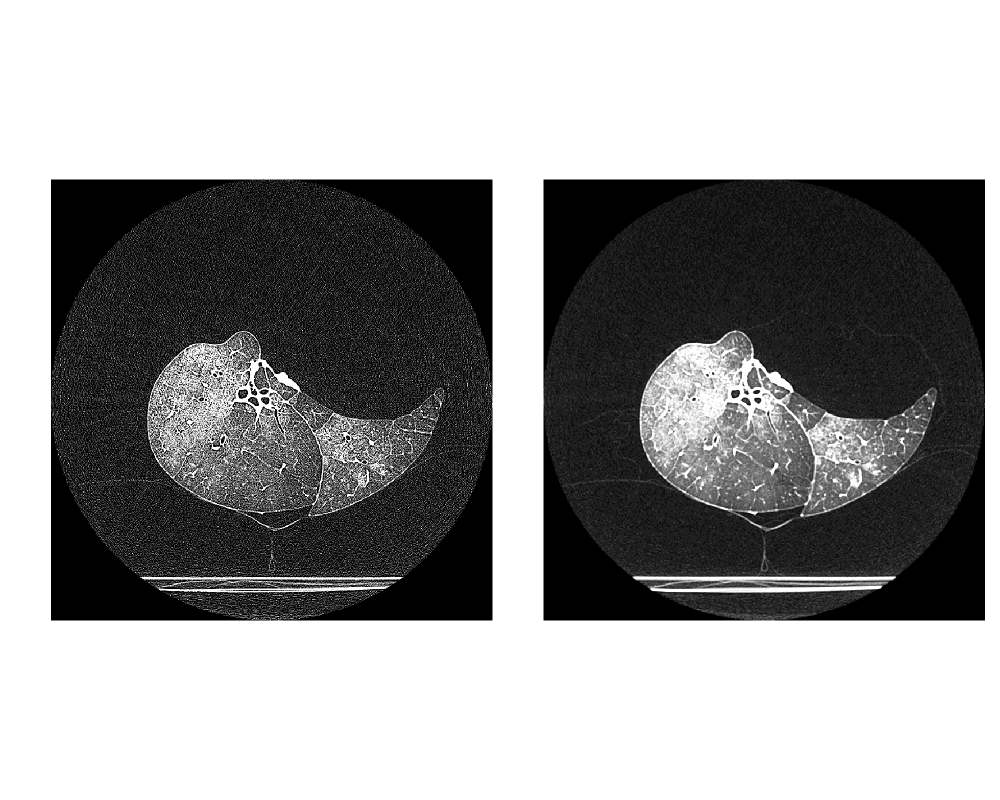

In [23]:
gui.MultiImageDisplay([img_plot, imsmooth], shared_slider=True)

## Segmentation on smoothed data

In [27]:
cc = sitk.ConfidenceConnectedImageFilter()
cc.AddSeed(initial_seed_point_indexes[0])
cc.SetNumberOfIterations(1)
cc.SetNumberOfThreads(10)
cc.SetMultiplier(1)
cc.SetInitialNeighborhoodRadius(5)
cc.SetReplaceValue(1)

In [28]:
seg_implicit_thresholds = cc.Execute(imsmooth)

In [29]:
imgSmoothInt = sitk.Cast(sitk.RescaleIntensity(imsmooth), seg_implicit_thresholds.GetPixelID())

<IPython.core.display.Javascript object>


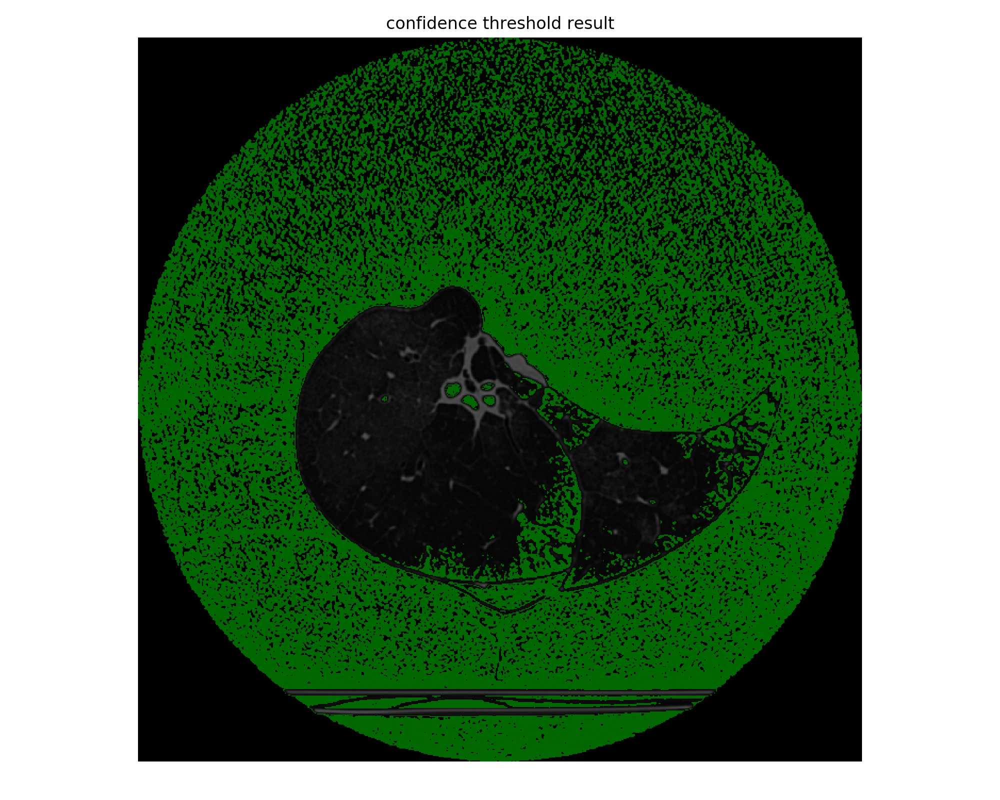

In [30]:
gui.MultiImageDisplay(image_list = [sitk.LabelOverlay(imgSmoothInt, seg_implicit_thresholds)],                   
                      title_list = ['confidence threshold result'])

## Clean up segmentation

We can use fill holes and remove small regions from the segmentation.

In [31]:
vectorRadius=(1,1,1)
kernel=sitk.sitkBall
seg_implicit_thresholds_clean = sitk.BinaryMorphologicalClosing(seg_implicit_thresholds, 
                                                                vectorRadius,
                                                                kernel)

<IPython.core.display.Javascript object>


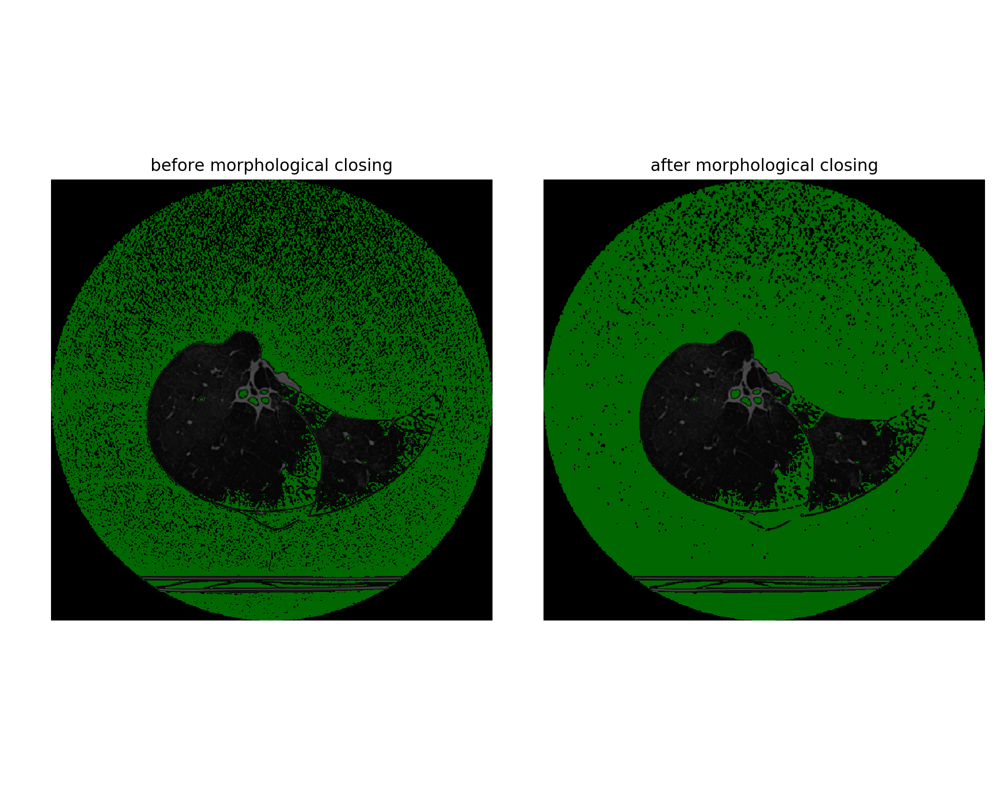

In [32]:
gui.MultiImageDisplay(image_list = [sitk.LabelOverlay(imgSmoothInt, seg_implicit_thresholds), 
                                sitk.LabelOverlay(imgSmoothInt, seg_implicit_thresholds_clean)], 
                  shared_slider=True,
                  title_list = ['before morphological closing', 'after morphological closing'])

## Masking lung
We should first mask the lung itself to make the segmentation easier.

I won't be able to apply exactly the same method as was used to mask the lung in images from the body, as the dense surrounding tissue is not there. Instead I will try:

1. Crop out what looks like the table (below 650 px)  
2. Start region growing from outside the lung with a very small threshold  
3. Apply morphological closing

This could also be intersected with the region growing I got above starting with the airways to subtract out the region outside the lung

### Cropping images

In [38]:
c_img.GetSize()

(768, 768, 800)

In [39]:
crop_img = imsmooth[:, :650, :]

<IPython.core.display.Javascript object>


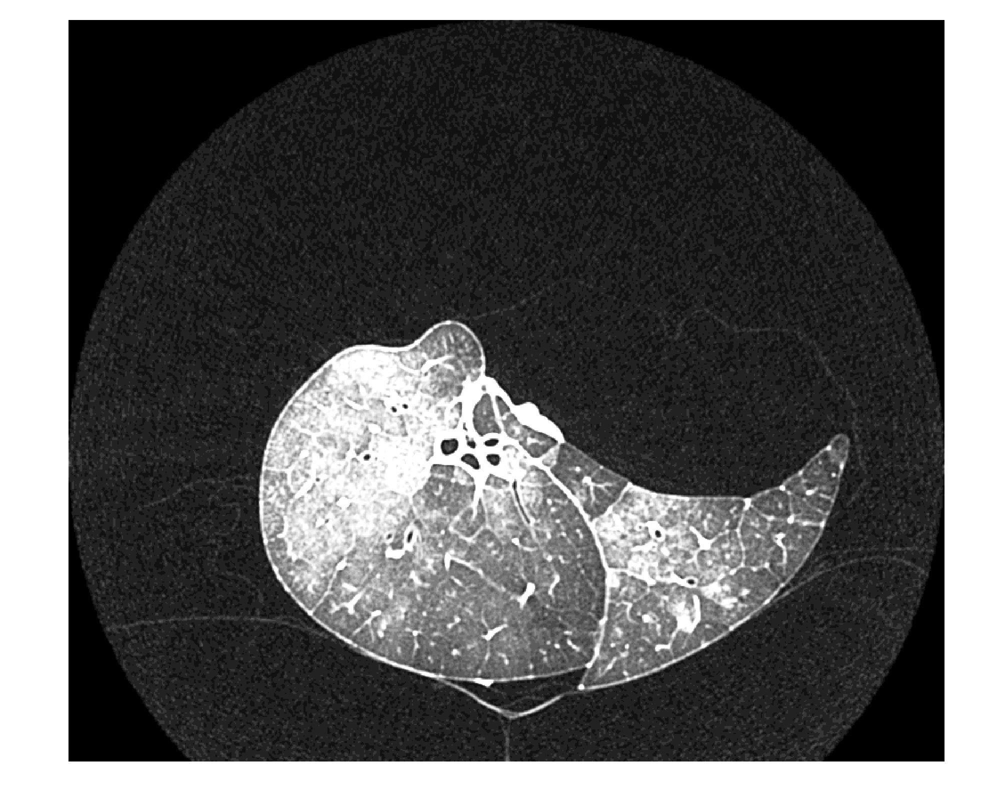

In [40]:
gui.MultiImageDisplay([crop_img])

### Region growing

<IPython.core.display.Javascript object>


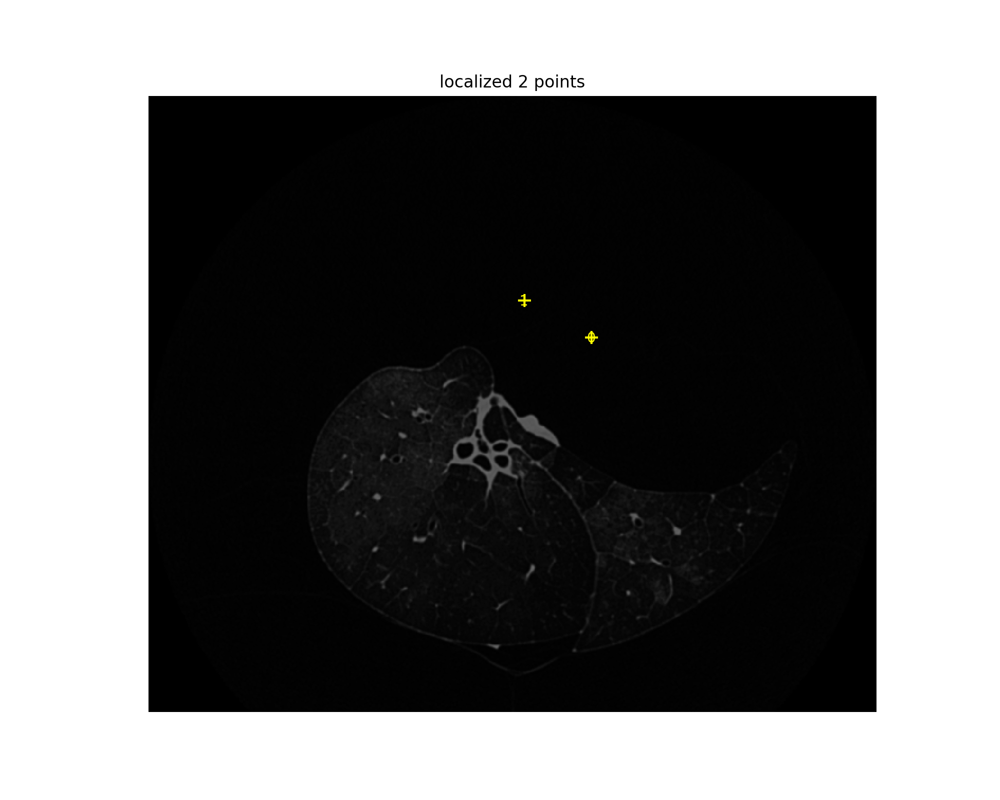

In [41]:
point_acquisition_interface = gui.PointDataAquisition(crop_img)

I'm just choosing a point outside the lung tissue here, it would be easy to hardcode a coordinate away from the middle of the image

In [42]:
initial_seeds = point_acquisition_interface.get_point_indexes()

In [43]:
initial_seeds

[(467, 254, 399), (396, 215, 399)]

In [53]:
background_segmentation = sitk.ConnectedThreshold(
    crop_img,
    seedList=initial_seeds,
    lower = 0,
    upper = 2,
    replaceValue=1
)

In [54]:
crop_img_int = sitk.Cast(sitk.RescaleIntensity(crop_img), background_segmentation.GetPixelID())

<IPython.core.display.Javascript object>


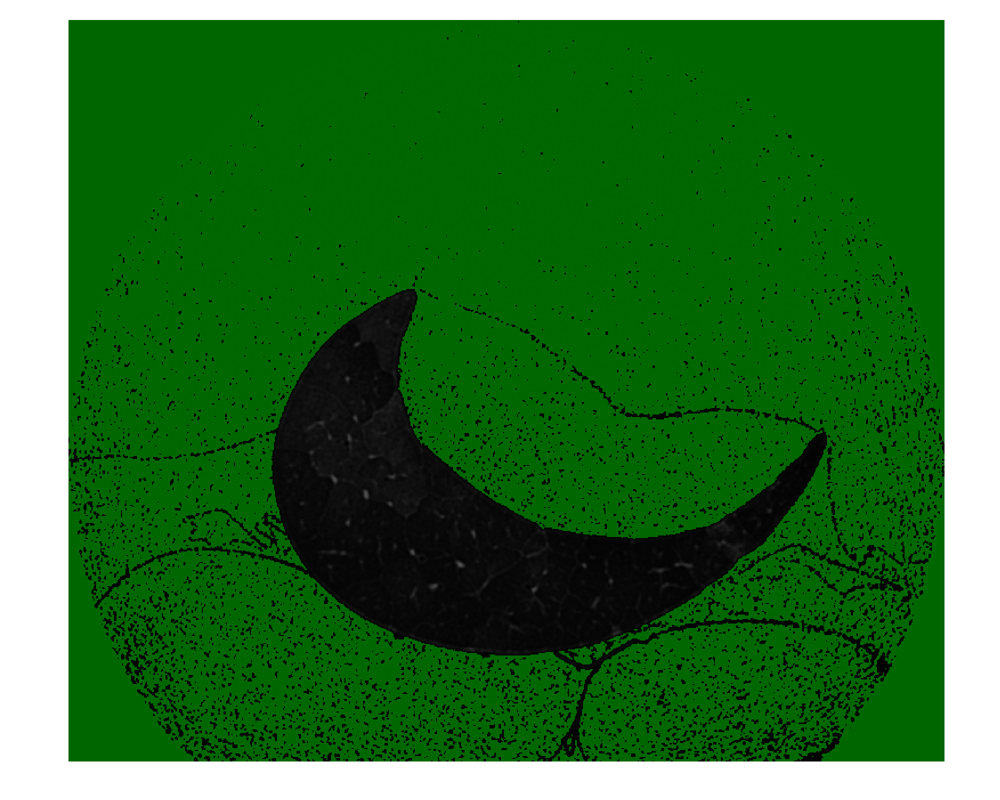

In [55]:
gui.MultiImageDisplay(image_list = [sitk.LabelOverlay(crop_img_int, background_segmentation)])

Expand to remove small unmasked regions

In [62]:
bd = sitk.BinaryDilateImageFilter()
bd.SetKernelRadius(5)

In [63]:
cleaned = bd.Execute(background_segmentation)

<IPython.core.display.Javascript object>


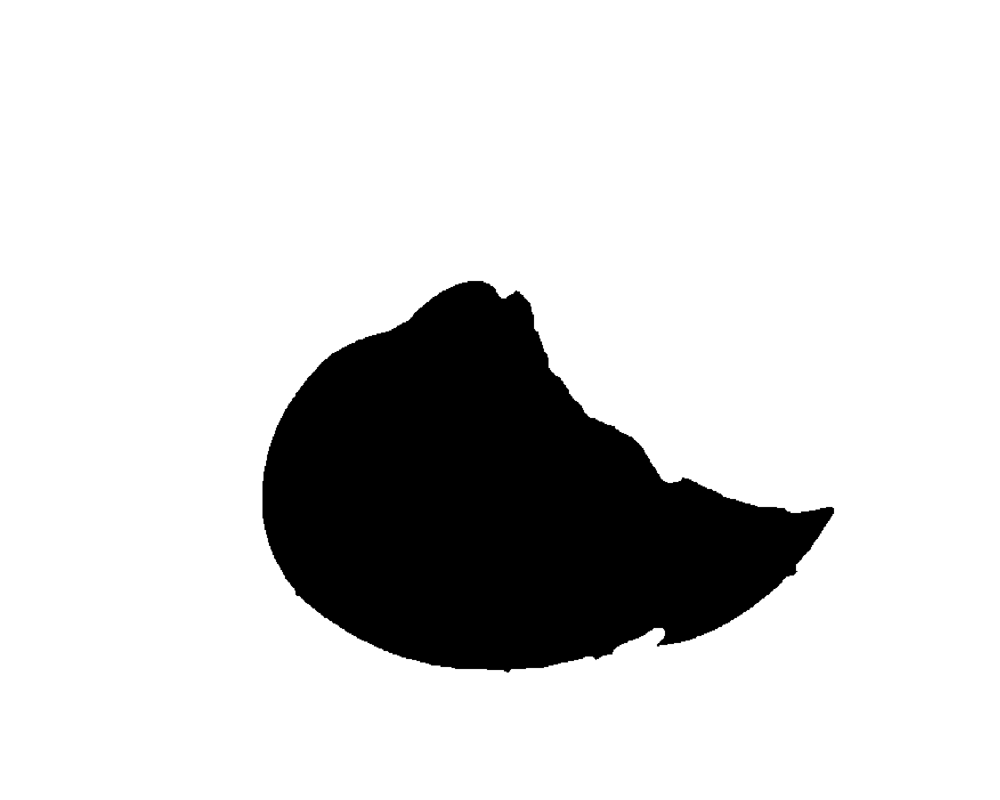

In [64]:
gui.MultiImageDisplay([cleaned])

Mask looks perfect

## Apply mask

Invert the mask, so we keep lung region and remove outside image. This is turns out to be very easy:

In [96]:
inverted = 1 - cleaned

Applying the mask is similarly easy

In [97]:
masked = crop_img_int * inverted

<IPython.core.display.Javascript object>


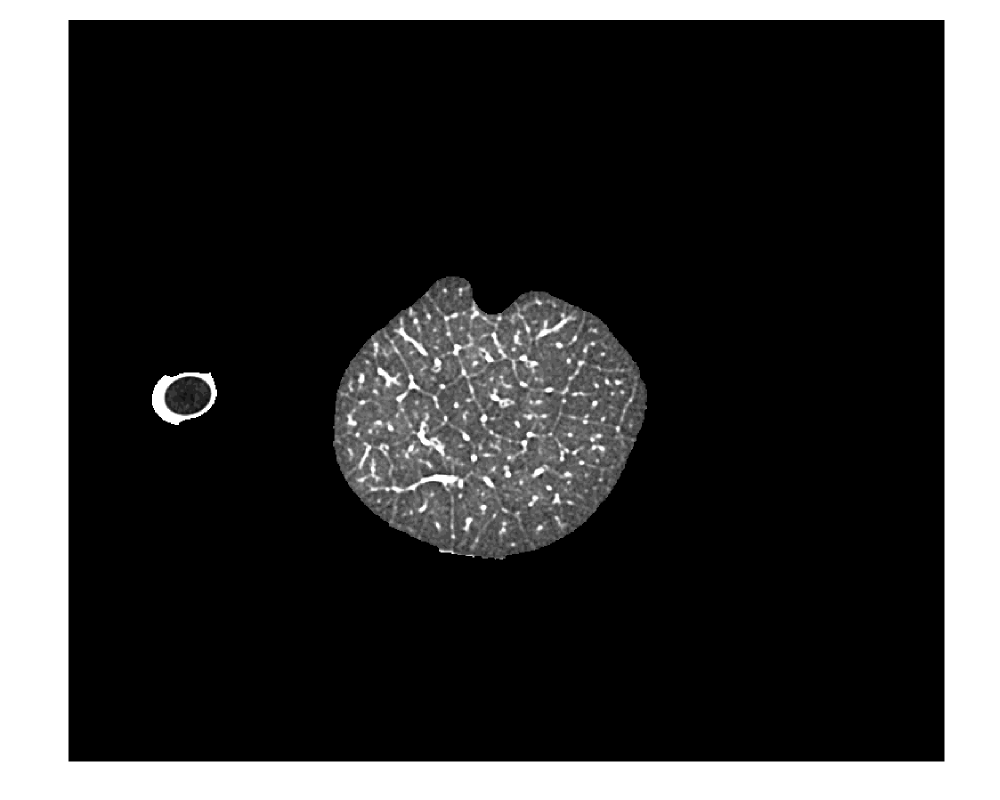

In [99]:
gui.MultiImageDisplay([masked])

## Segmentation of masked image

Repeat the region-growing segmentation using the masked, smoothed image. We can reuse the same seed points

In [141]:
cc = sitk.ConfidenceConnectedImageFilter()
cc.AddSeed(initial_seed_point_indexes[0])
cc.SetNumberOfIterations(1)
cc.SetNumberOfThreads(10)
cc.SetMultiplier(2)
cc.SetInitialNeighborhoodRadius(3)
cc.SetReplaceValue(1)

In [142]:
segmentation = cc.Execute(masked)

<IPython.core.display.Javascript object>


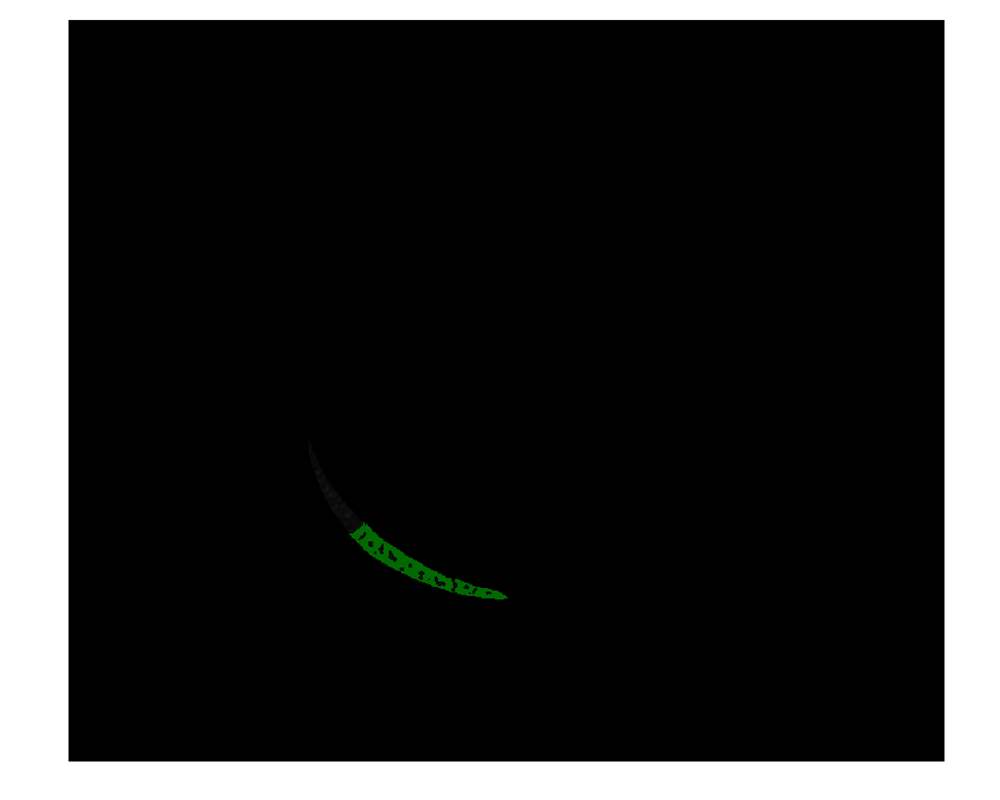

In [143]:
gui.MultiImageDisplay(image_list = [sitk.LabelOverlay(masked, segmentation)])

Try different kind of smoothing (CurvatureFlow)

In [240]:
cf = sitk.CurvatureFlowImageFilter()

In [241]:
cf.SetNumberOfThreads(10)
cf.SetNumberOfIterations(5)
cf.SetTimeStep(0.01)

In [242]:
cf_smooth = cf.Execute(img_int[:, :650, :])

<IPython.core.display.Javascript object>


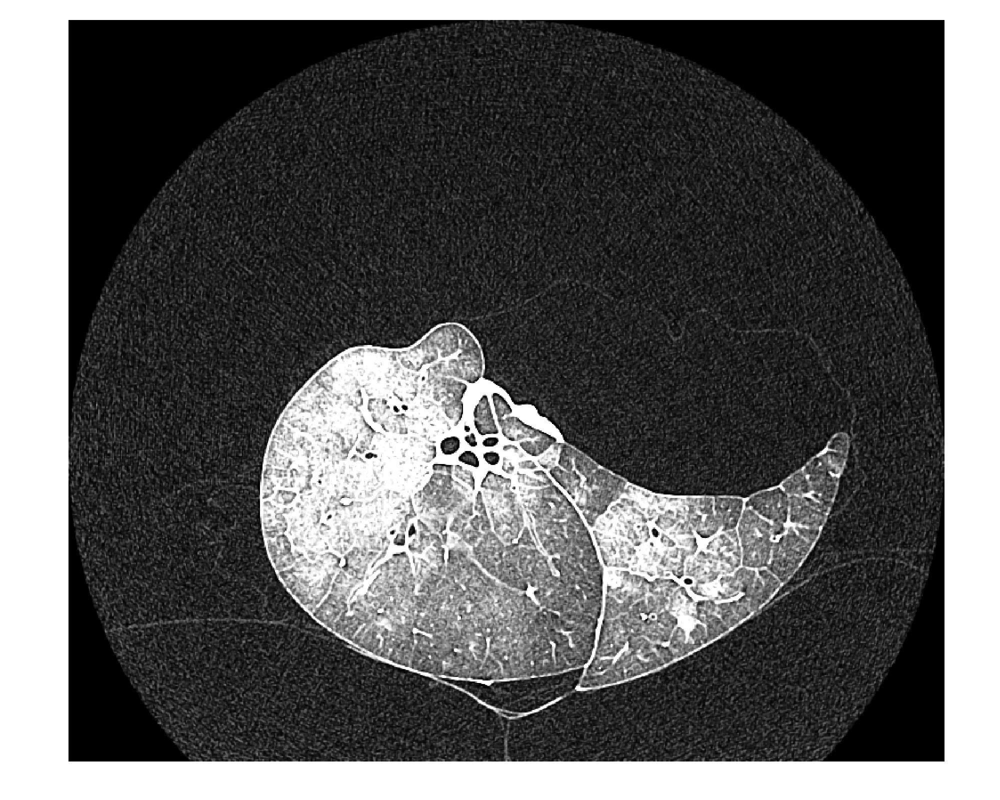

In [243]:
gui.MultiImageDisplay([cf_smooth])

In [244]:
cf_smooth = sitk.Cast(sitk.RescaleIntensity(cf_smooth), segmentation.GetPixelID())

In [245]:
masked_cfsmooth = cf_smooth * inverted

In [247]:
cc = sitk.ConfidenceConnectedImageFilter()
cc.AddSeed(initial_seed_point_indexes[0])
cc.SetNumberOfIterations(1)
cc.SetNumberOfThreads(10)
cc.SetMultiplier(1)
cc.SetInitialNeighborhoodRadius(3)
cc.SetReplaceValue(1)

In [248]:
segmentation = cc.Execute(masked_cfsmooth)

<IPython.core.display.Javascript object>


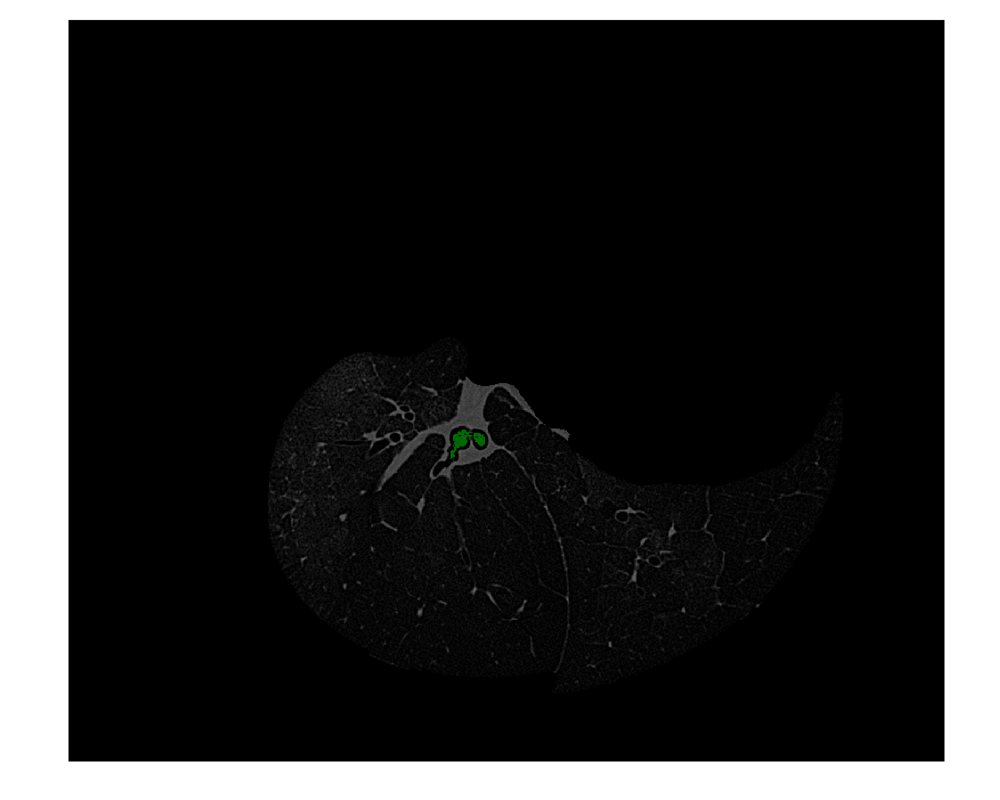

In [249]:
gui.MultiImageDisplay(image_list = [sitk.LabelOverlay(masked_nosmooth, segmentation)])

## Dilate

We can dilate to close the gaps

In [250]:
bd = sitk.BinaryDilateImageFilter()
bd.SetKernelRadius(2)

In [251]:
dilate_segmentation = bd.Execute(segmentation)

<IPython.core.display.Javascript object>


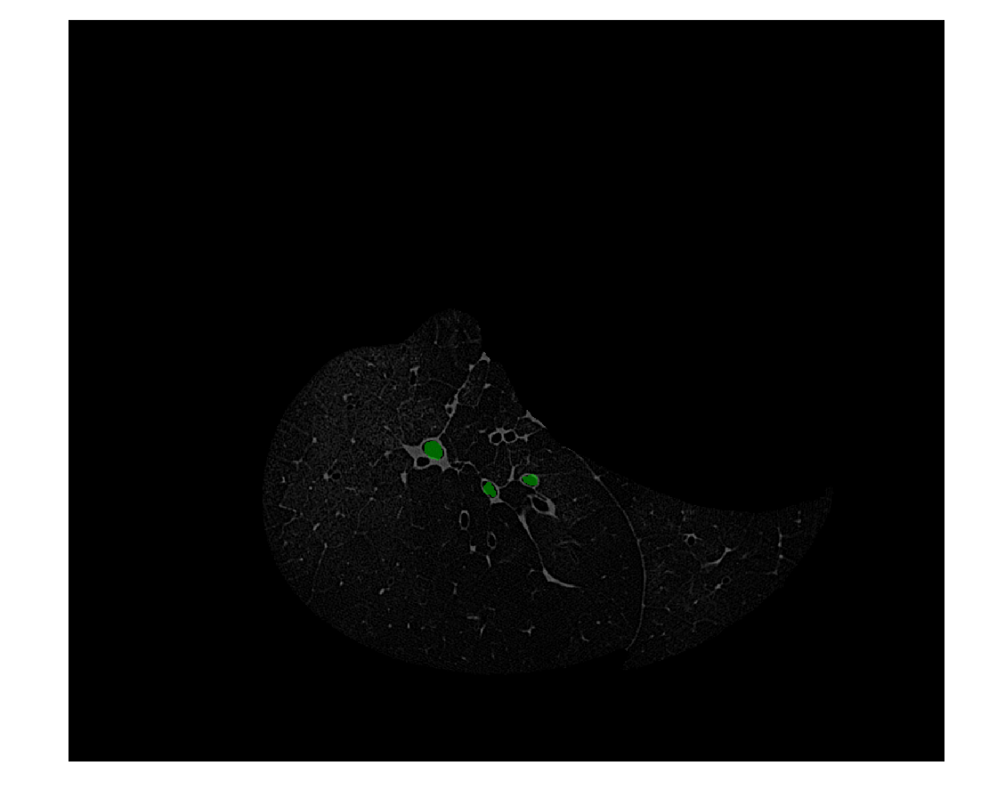

In [252]:
gui.MultiImageDisplay(image_list = [sitk.LabelOverlay(masked_nosmooth, dilate_segmentation)])

## Build airway tree from segmentation
The above segmentation still isn't great but I will move on. It could be improved if we can add a penalty for expanding the segmentation in x-y plane, as we know the airways are small and should therefore penalize large volumes. If the threshold in x-y adapted to the total volume of the expanding area in the plane, then we should be able to stop the segmentation breaking into the lung space and engulfing everything, and favor small regions that penetrate deep into the lung, by not having the same penalty apply in the z-stack.

It would also be good to visualize the segmentation in 3d -- something to try later.

To build the airway tree, we need to convert these segmented regions to branching lines in the 3d space. We can do this by first doing edge detection, then finding the midpoint between the edges.

See https://link.springer.com/chapter/10.1007/3-540-45787-9_2